In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
# using Turing
# using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using LsqFit
using BlackBoxOptim
using LaTeXStrings
using JLD2
using BlackBoxOptim: num_func_evals
# using LatinHypercubeSampling

# Load Model Functions

In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")

ObjectFunctMECp (generic function with 1 method)

# Load Data and Pyruvate T1s

In [3]:
global dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global dat128mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_12-8mMPyr_Dat.csv", DataFrame));

global datT1 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\T1s.csv", DataFrame));

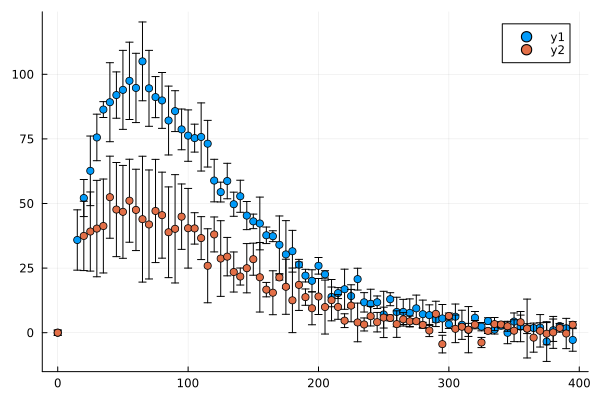

In [4]:
scatter(dat32mM[:,1], dat32mM[:,4], yerror=dat32mM[:,5])
scatter!(dat128mM[:,1], dat128mM[:,4], yerror=dat128mM[:,5])

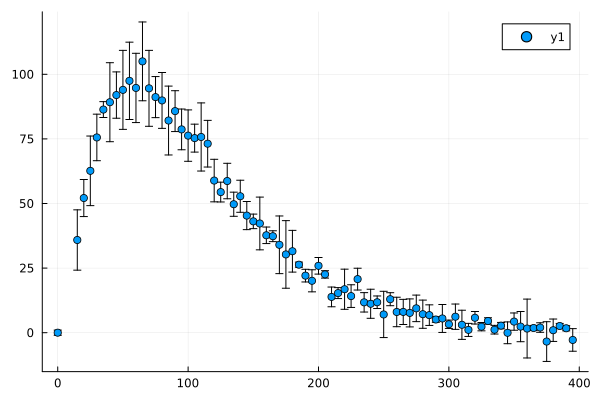

In [5]:
scatter(dat32mM[:,1], dat32mM[:,4], yerror=dat32mM[:,5])

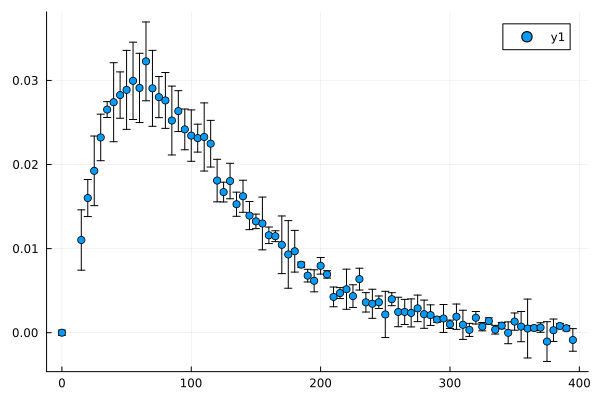

In [6]:
scatter(dat32mM[:,1], dat32mM[:,4]./3254, yerror=dat32mM[:,5]./3254)

# Scalling Factor Calculation

In [5]:
P0s = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\P0s.jld")["P0s"][1:11]

11-element Vector{Float64}:
 6958.136589956337
 7458.120114620354
 8741.632824259454
 6696.892817182159
 7930.229145133655
 6716.359226048676
 5841.831099561959
 7670.508942892556
 7723.389923004057
 6271.245659842545
 6149.3221399365375

In [6]:
global ScF = Normal(mean(P0s./(3200*0.12)), std(P0s./(3200*0.12)))

Normal{Float64}(μ=18.503235909668152, σ=2.289548900260472)

In [7]:
global ScFm = mean(P0s./(3200*0.12))

18.503235909668152

In [8]:
P0s[1]/(ScFm*0.12)

3133.7476247963705

# Test Models

# Plots

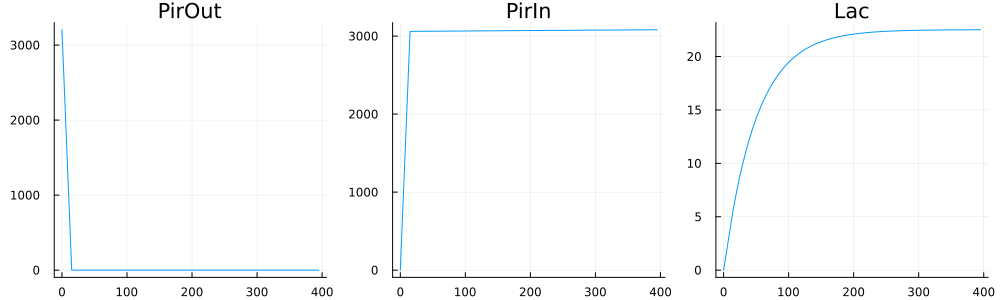

In [13]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12),0, dat32mM[1,4]/(ScFm*0.12), 50/(ScFm*0.12), 5000/(ScFm*0.12), 700/(ScFm*0.12), 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4]/(ScFm*0.12)]; # Pout, Php, Xhp, NADH, NAD, LDH, LDHac, LDHacE, LDHna, LDHP, XhpHyper
samps = convert.(Int, tsC2);
pp = [48*100000, 55*100000, 0.044*100000, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-4, 1e-3, ScFm] # T1_X, T1_P, kin, kpl, kbn, kun, kbp, kup, kunE, kbnE, ki, kr
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PirOut")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PirIn")
p3 = plot(tsC2, SimOnTime1[:,11,:], label = "", title = "Lac")

plot(p1, p2, p3, size=(1000,300), layout = (1,3))

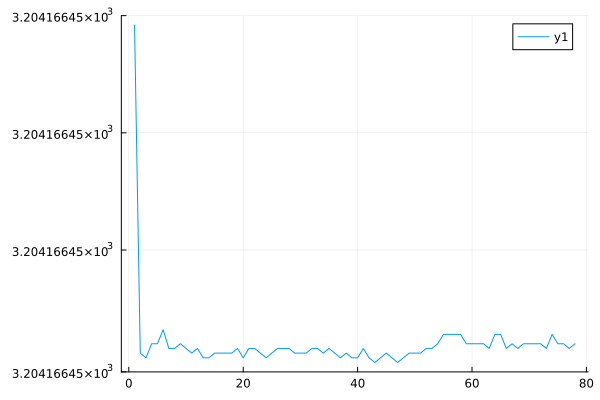

GKS: Possible loss of precision in routine SET_WINDOW


In [14]:
plot(SimOnTime1[:,1,:]+SimOnTime1[:,2,:]+SimOnTime1[:,9,:]+SimOnTime1[:,10,:]+SimOnTime1[:,3,:])

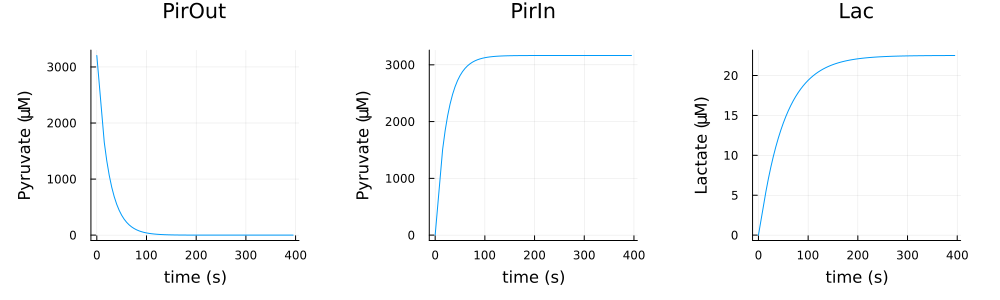

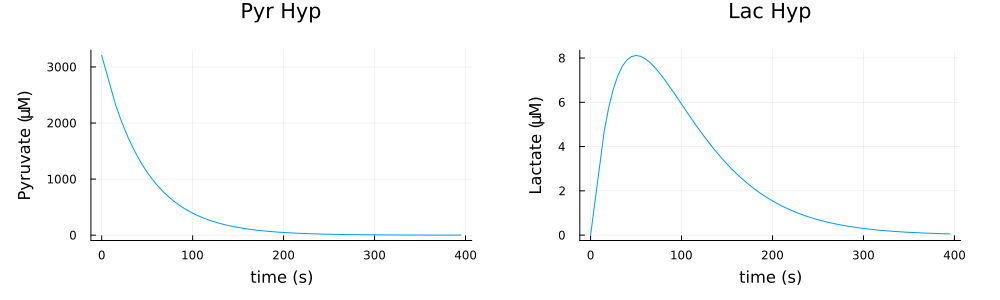

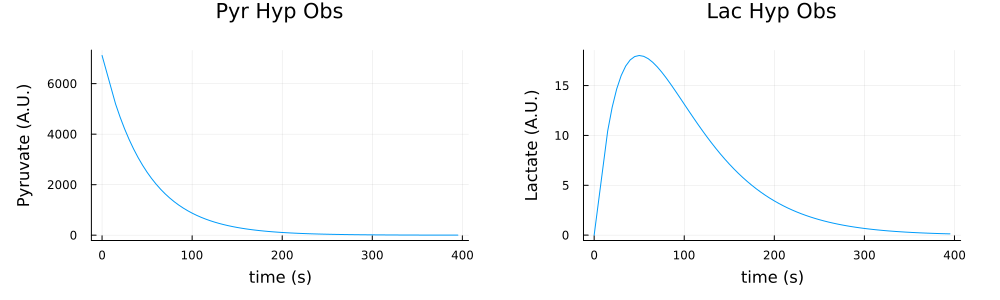

In [15]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12),0, dat32mM[1,4]/(ScFm*0.12), 50/(ScFm*0.12), 5000/(ScFm*0.12), 700/(ScFm*0.12), 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]]; # Pout, Php, Xhp, NADH, NAD, LDH, LDHac, LDHacE, LDHna, LDHP, XhpHyper
samps = convert.(Int, tsC2);
pp = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-4, 1e-3, ScFm] # T1_X, T1_P, kin, kpl, kbn, kun, kbp, kup, kunE, kbnE, ki, kr
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PirOut", xlabel = "time (s)", ylabel = raw"Pyruvate (\muM)")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PirIn", xlabel = "time (s)", ylabel = raw"Pyruvate (\muM)")
p3 = plot(tsC2, SimOnTime1[:,3,:], label = "", title = "Lac", xlabel = "time (s)", ylabel = raw"Lactate (\muM)")

display(plot(p1, p2, p3, size=(1000,300), layout = (1,3), margin = 8mm))

p1 = plot(tsC2, SimOnTime1[:,12,:], label = "", title = "Pyr Hyp", ylabel = raw"Pyruvate (\muM)", xlabel = "time (s)")
p2 = plot(tsC2, SimOnTime1[:,11,:], label = "", title = "Lac Hyp", ylabel = raw"Lactate (\muM)", xlabel = "time (s)")

display(plot(p1, p2, size=(1000,300), layout = (1,2), margin = 8mm))

p1 = plot(tsC2, SimOnTime1[:,14,:], label = "", title = "Pyr Hyp Obs", ylabel = raw"Pyruvate (A.U.)", xlabel = "time (s)")
p2 = plot(tsC2, SimOnTime1[:,13,:], label = "", title = "Lac Hyp Obs", ylabel = raw"Lactate (A.U.)", xlabel = "time (s)")

plot(p1, p2, size=(1000,300), layout = (1,2), margin = 8mm)

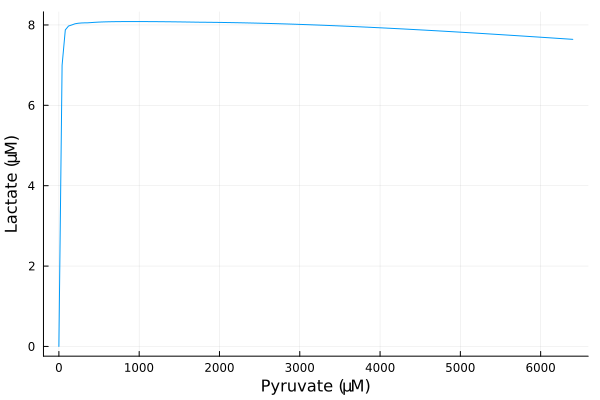

In [16]:
pyrs = collect(0:40:3200*2);
lacs = zeros(length(pyrs));

sims = Array{Any}(undef, length(pyrs))

pp = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, ScFm]
cnt = 1;

for i in pyrs

    try
    tsC2 = dat32mM[:,1]
    ts = 0:tsC2[end];
    ivss = [i,0, dat32mM[1,4]/(ScFm*0.12), 50/(ScFm*0.12), 5000/(ScFm*0.12), 700/(ScFm*0.12), 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
    samps = convert.(Int, tsC2);
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(vcat(pp), 0), ivss, samps);

    lacs[cnt] = maximum(SimOnTime1[:,11]);
    sims[cnt] = SimOnTime1;
    catch

    end
    cnt += 1;

end

plot(pyrs, lacs, label = "", xlabel = raw"Pyruvate (\muM)", ylabel = raw"Lactate (\muM)")


# Fitting

In [18]:
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 50/(ScFm*0.12), 5000/(ScFm*0.12), 700/(ScFm*0.12)];

ObjectFunctMECp(p)

71683.16561918323

In [19]:
T1ss = vcat(datT1[1:5,2], datT1[7:11,2]);

In [20]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [ ]:
# T1_X, T1_P, kin, kpl, kbn, kun, kbp, kup, kunE, kbnE, ki, kr

In [54]:
p = [48.0
55.0
 0.007994249710060427
 0.01859967209120981
 0.0008762538285441578
 0.0015864255670811074
 0.008468502220954898
 9.408498984632358e-6
 3.7719236408119625e-5
 5.241887422162764e-7
 0.9051239802744461
 5.190671630576264e-7
819.618572681817
6910.1858658409155
195.04120570777286]

15-element Vector{Float64}:
   48.0
   55.0
    0.007994249710060427
    0.01859967209120981
    0.0008762538285441578
    0.0015864255670811074
    0.008468502220954898
    9.408498984632358e-6
    3.7719236408119625e-5
    5.241887422162764e-7
    0.9051239802744461
    5.190671630576264e-7
  819.618572681817
 6910.1858658409155
  195.04120570777286

In [56]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp, p; SearchRange = [(48, 48), (55, 55), (0, 0.008), (1e-50, 1), (1e-50, 1), 
                                                    (0, 1), (0, 1), (0, 1), 
                                                    (0, 1), (0, 1), (0, 1), (0, 1), (450, 450*4), (3150, 3150*4), 
                                                    (0, dat32mM[1,2]*4)], # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*5, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.52 secs, 80 evals, 46 steps, improv/step: 0.457 (last = 0.4565), fitness=446.317093194
1.03 secs, 161 evals, 99 steps, improv/step: 0.414 (last = 0.3774), fitness=446.317093194
1.56 secs, 243 evals, 158 steps, improv/step: 0.392 (last = 0.3559), fitness=446.317093194
2.07 secs, 321 evals, 223 steps, improv/step: 0.372 (last = 0.3231), fitness=446.317093194
2.57 secs, 401 evals, 294 steps, improv/step: 0.374 (last = 0.3803), fitness=446.317093194
3.08 secs, 479 evals, 370 steps, improv/step: 0.362 (last = 0.3158), fitness=446.317093194
3.58 secs, 554 evals, 442 steps, improv/step: 0.367 (last = 0.3889), fitness=446.317093194
4.08 secs, 627 evals, 513 steps, improv/step: 0.361 (last = 0.3239), fitness=446.317093194
4.63 secs, 706 evals, 591 steps, improv/step: 0.350 (last = 0.2821), fi

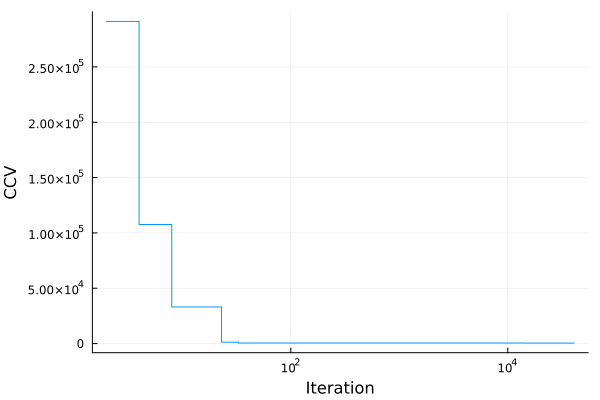

In [57]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
# for i in 2:length(CCsT)
#     plot!(CCsT[i], xaxis=:log, linetype=:step, label = "")
# end

display(pl)

In [58]:
parfitT = zeros(15, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end

In [59]:
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))

1

In [60]:
ppT = parfitT[:,bestPind]

15-element Vector{Float64}:
    48.0
    55.0
     0.005910549678146527
     0.01832482607115736
     0.042170963403865704
     0.5365343240440853
     0.9804709927131193
     0.9912565141308517
     0.9333563326017652
     0.0082407166003616
     0.9943848461646142
     0.001974060165641816
   450.36021331030577
 12599.812966430234
   226.45693392364814

In [61]:
ObjectFunctMECp(ppT)

438.64770482591535

In [62]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMTRRCmp_ScF_New3.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMVectTRRCmp_ScF_New3.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [11]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMVectTRRCmp_ScF_New3.jld2")["resMMat"][:,1]


15-element Vector{Float64}:
    48.0
    55.0
     0.005910549678146527
     0.01832482607115736
     0.042170963403865704
     0.5365343240440853
     0.9804709927131193
     0.9912565141308517
     0.9333563326017652
     0.0082407166003616
     0.9943848461646142
     0.001974060165641816
   450.36021331030577
 12599.812966430234
   226.45693392364814

## Plot Results

In [12]:
N=4
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end-2], ppT[end-1], ppT[end], 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
samps = convert.(Int, tsC2);
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:end-3], ScFm, 0), ivss, samps);


tsC4 = dat128mM[:,1]
ts = 0:tsC4[end];
ivss = [dat128mM[1,2]/(ScFm*0.12), 0, dat128mM[1,4]/(ScFm*0.12), ppT[end-2], ppT[end-1], ppT[end], 0, 0, 0, 0, 0, dat128mM[1,2]/(ScFm*0.12), dat128mM[1,4], dat128mM[1,2]];
samps = convert.(Int, tsC4);
SimOnTime2, SimOffTime2, SimAll2  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:end-3], ScFm, 0), ivss, samps);



In [64]:
dat128mM[1,2]

34670.694942714574

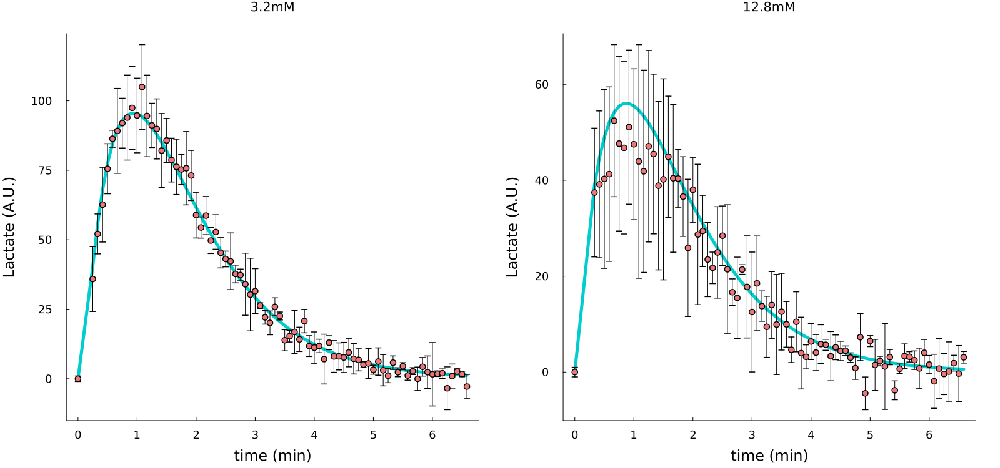

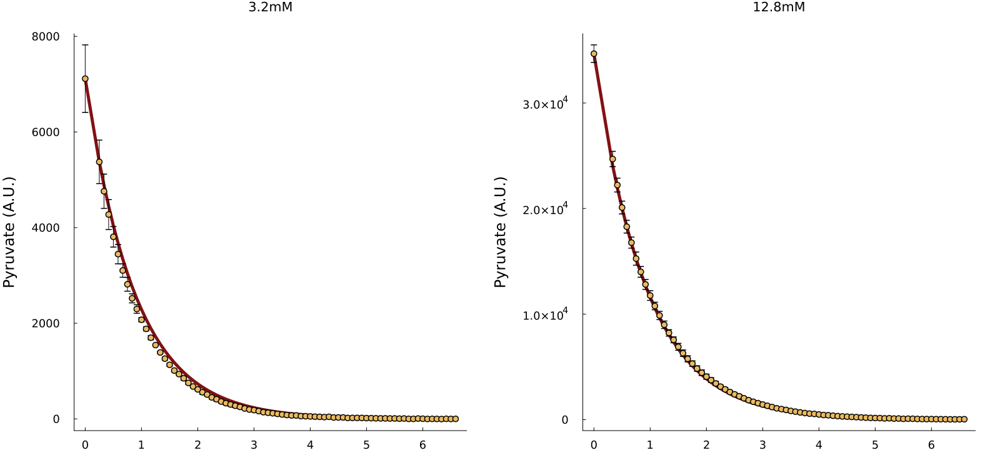

In [14]:
pp1 = plot(tsC2./60, SimOnTime1[:,14,1], linewidth = 5, color = "#821114ff", label = "", title = "2 Mil")
scatter!(tsC2./60, dat32mM[:,2], yerror = dat32mM[:,3], label = "", xlabel="", ylabel = "Pyruvate (A.U.)", grid = false, color="#eaba61ff", markersize=5)

pp2 = plot(tsC2./60, SimOnTime1[:,13,1], linewidth = 5, color = "Cyan3", label = "")
scatter!(tsC2./60, dat32mM[:,4], yerror = dat32mM[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=5)

P1 = plot(pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "3.2mM")
P1b = plot(pp1, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "3.2mM")

pp1 = plot(tsC4./60, SimOnTime2[:,14,1], linewidth = 5, color = "#821114ff", label = "", title = "4 Mil")
scatter!(tsC4./60, dat128mM[:,2], yerror = dat128mM[:,3], label = "", xlabel="", ylabel = "Pyruvate (A.U.)", grid = false, color="#eaba61ff", markersize=5)

pp2 = plot(tsC4./60, SimOnTime2[:,13,1], linewidth = 5, color = "Cyan3", label = "")
scatter!(tsC4./60, dat128mM[:,4], yerror = dat128mM[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=5)

P2 = plot(pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "12.8mM")
P2b = plot(pp1, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "12.8mM")


pF = plot(P1,P2, layout=(1,2), size = (1600,750))
pFb = plot(P1b,P2b, layout=(1,2), size = (1600,750))


# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorTestCompetitiveFit_ScF.svg")


display(pF)
display(pFb)

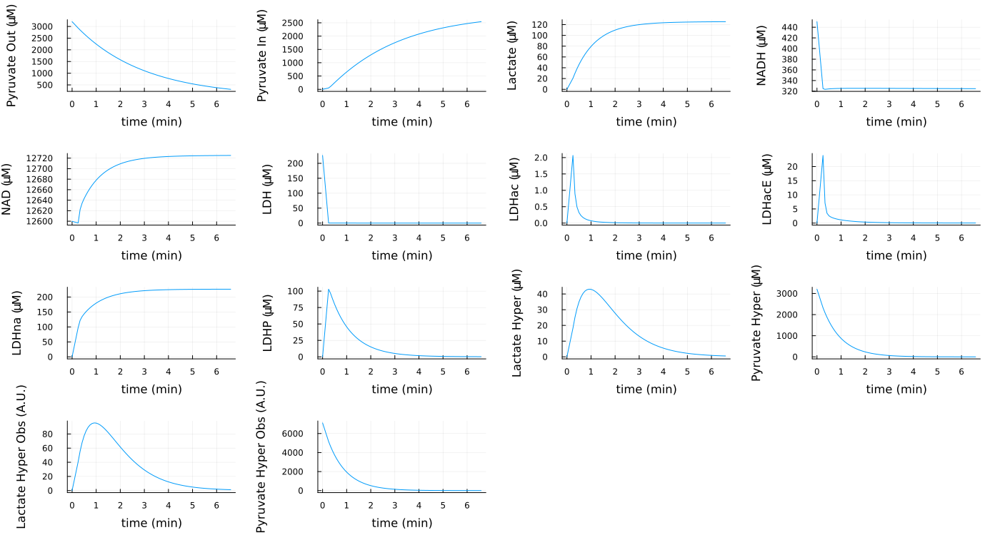

In [66]:
po1 = plot(tsC2./60, SimOnTime1[:,1,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Out (\muM)")
po2 = plot(tsC2./60, SimOnTime1[:,2,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate In (\muM)")
po3 = plot(tsC2./60, SimOnTime1[:,3,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po4 = plot(tsC2./60, SimOnTime1[:,4,1], label = "", xlabel = "time (min)", ylabel = raw"NADH (\muM)")
po5 = plot(tsC2./60, SimOnTime1[:,5,1], label = "", xlabel = "time (min)", ylabel = raw"NAD (\muM)")
po6 = plot(tsC2./60, SimOnTime1[:,6,1], label = "", xlabel = "time (min)", ylabel = raw"LDH (\muM)")
po7 = plot(tsC2./60, SimOnTime1[:,7,1], label = "", xlabel = "time (min)", ylabel = raw"LDHac (\muM)")
po8 = plot(tsC2./60, SimOnTime1[:,8,1], label = "", xlabel = "time (min)", ylabel = raw"LDHacE (\muM)")
po9 = plot(tsC2./60, SimOnTime1[:,9,1], label = "", xlabel = "time (min)", ylabel = raw"LDHna (\muM)")
po10 = plot(tsC2./60, SimOnTime1[:,10,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP (\muM)")
po11 = plot(tsC2./60, SimOnTime1[:,11,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper (\muM)")
po12 = plot(tsC2./60, SimOnTime1[:,12,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper (\muM)")
po13 = plot(tsC2./60, SimOnTime1[:,13,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper Obs (A.U.)")
po14 = plot(tsC2./60, SimOnTime1[:,14,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper Obs (A.U.)")

plot(po1, po2, po3, po4, po5, po6, po7, po8, po9, po10, po11, po12, po13, po14 , size = (1400,750), margin = 5mm)


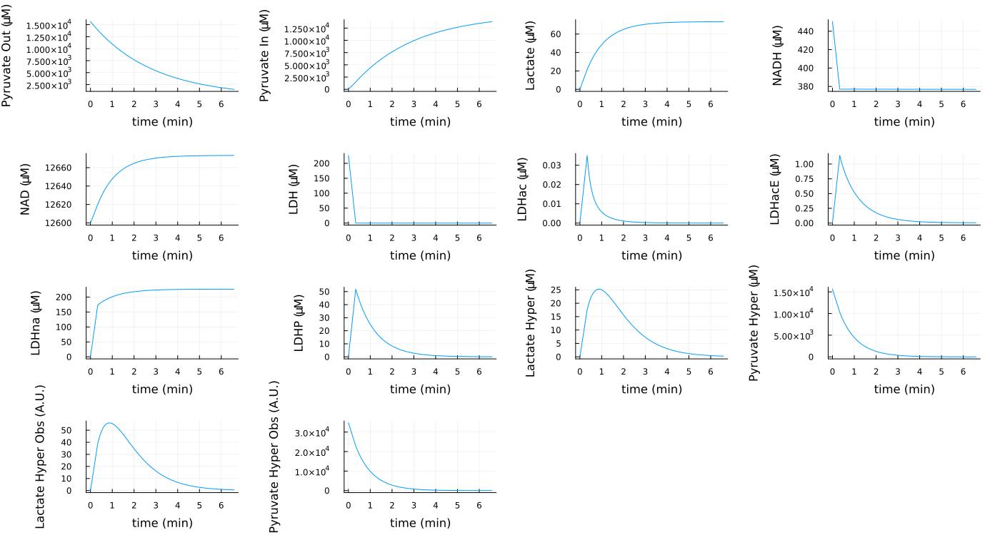

In [67]:
po1 = plot(tsC4./60, SimOnTime2[:,1,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Out (\muM)")
po2 = plot(tsC4./60, SimOnTime2[:,2,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate In (\muM)")
po3 = plot(tsC4./60, SimOnTime2[:,3,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po4 = plot(tsC4./60, SimOnTime2[:,4,1], label = "", xlabel = "time (min)", ylabel = raw"NADH (\muM)")
po5 = plot(tsC4./60, SimOnTime2[:,5,1], label = "", xlabel = "time (min)", ylabel = raw"NAD (\muM)")
po6 = plot(tsC4./60, SimOnTime2[:,6,1], label = "", xlabel = "time (min)", ylabel = raw"LDH (\muM)")
po7 = plot(tsC4./60, SimOnTime2[:,7,1], label = "", xlabel = "time (min)", ylabel = raw"LDHac (\muM)")
po8 = plot(tsC4./60, SimOnTime2[:,8,1], label = "", xlabel = "time (min)", ylabel = raw"LDHacE (\muM)")
po9 = plot(tsC4./60, SimOnTime2[:,9,1], label = "", xlabel = "time (min)", ylabel = raw"LDHna (\muM)")
po10 = plot(tsC4./60, SimOnTime2[:,10,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP (\muM)")
po11 = plot(tsC4./60, SimOnTime2[:,11,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper (\muM)")
po12 = plot(tsC4./60, SimOnTime2[:,12,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper (\muM)")
po13 = plot(tsC4./60, SimOnTime2[:,13,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper Obs (A.U.)")
po14 = plot(tsC4./60, SimOnTime2[:,14,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper Obs (A.U.)")

plot(po1, po2, po3, po4, po5, po6, po7, po8, po9, po10, po11, po12, po13, po14 , size = (1400,750), margin = 5mm)

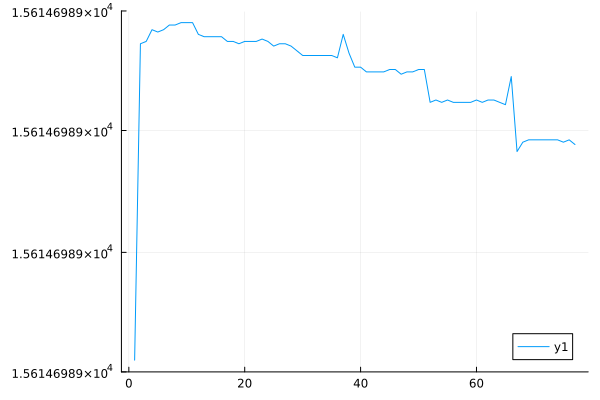

In [68]:
plot(SimOnTime2[:,1,1]+SimOnTime2[:,2,1]+SimOnTime2[:,3,1]+SimOnTime2[:,9,1]+SimOnTime2[:,10,1])

In [108]:
ppT

15-element Vector{Float64}:
   48.0
   55.0
    0.07925709789767374
    0.018825814449181532
    0.00041101127889715415
    0.0008575456956991298
    0.2621233069657301
    1.9637897932230332e-5
    0.9266981108437105
    0.002651585867000197
    0.9299350422447389
    0.37250763389071284
  125.65800170097188
 6609.983338198009
 5883.555304569842

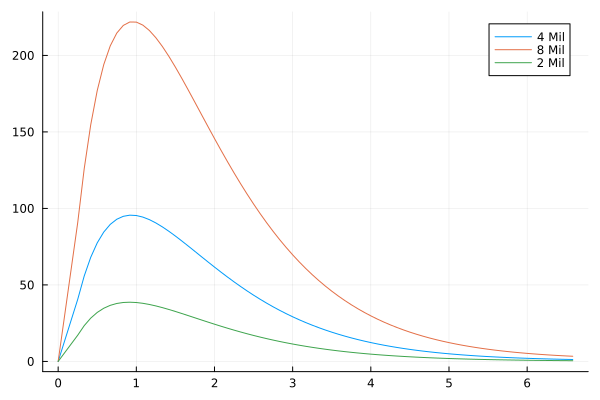

In [71]:
N=4
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss1 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end-2], ppT[end-1], ppT[end], 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
ivss2 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end-2]*2, ppT[end-1]*2, ppT[end]*2, 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
ivss3 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end-2]/2, ppT[end-1]/2, ppT[end]/2, 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];

samps = convert.(Int, tsC2);
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:end-3], ScFm, 0), ivss1, samps);
SimOnTime2, SimOffTime2, SimAll2  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:2], ppT[3]*2, ppT[4:end-3], ScFm, 0), ivss2, samps);
SimOnTime3, SimOffTime3, SimAll3  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:2], ppT[3]/2, ppT[4:end-3], ScFm, 0), ivss3, samps);


plot(tsC2./60, SimOnTime1[:,13,1], label = "4 Mil")
plot!(tsC2./60, SimOnTime2[:,13,1], label = "8 Mil")
plot!(tsC2./60, SimOnTime3[:,13,1], label = "2 Mil")

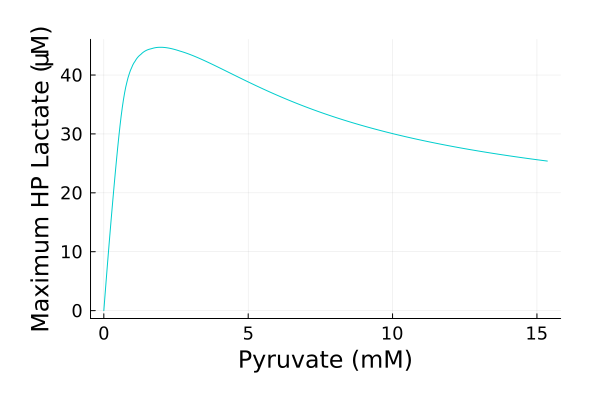

In [81]:
pyrs = collect(0:40:12800*1.2);
lacs = zeros(length(pyrs));

sims = Array{Any}(undef, length(pyrs))


cnt = 1;

for i in pyrs

    try
    tsC2 = dat32mM[:,1]
    ts = 0:tsC2[end];
    ivss = [i,0, dat32mM[1,4]/(ScFm*0.12), ppT[end-2], ppT[end-1], ppT[end], 0, 0, 0, 0, 0, i, dat32mM[1,4], i];
    samps = convert.(Int, tsC2);
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts, vcat(ppT[1:end-3], ScFm, 0), ivss, samps);

    lacs[cnt] = maximum(SimOnTime1[:,11]);
    sims[cnt] = SimOnTime1;
    catch

    end
    cnt += 1;

end

pps = plot(pyrs./1000, lacs, label = "", xlabel = raw"Pyruvate (mM)", ylabel = raw"Maximum HP Lactate (\muM)", color="Cyan3", margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("D:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PyrLacRatCompetitiveFit_ScF.svg")

display(pps)

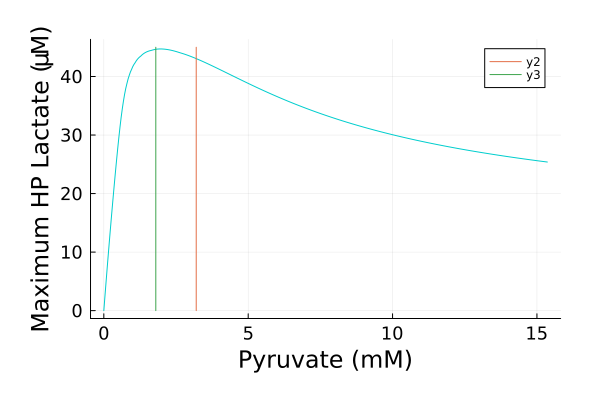

In [82]:
pps
plot!([3.2, 3.2],[0, 45])
plot!([1.8, 1.8],[0, 45])

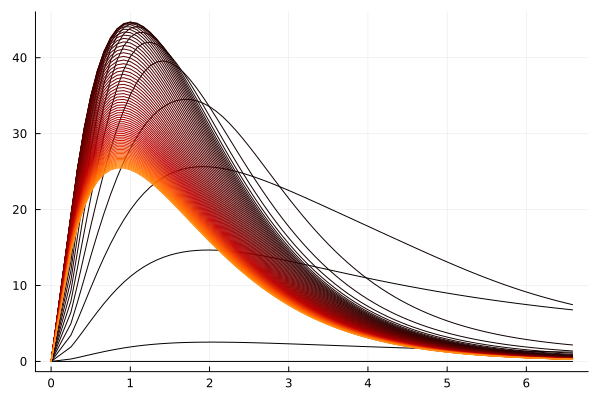

In [73]:
ps = plot(tsC2./60, sims[1][:,11,1], label = "", palette = :gist_heat) # Black low numbers, red middle, and white high
for i in 2:5:length(sims)
    plot!(tsC2./60, sims[i][:,11,1], label = "")
end

display(ps)

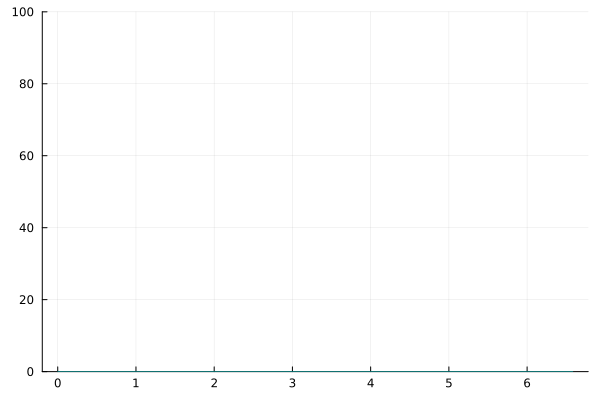

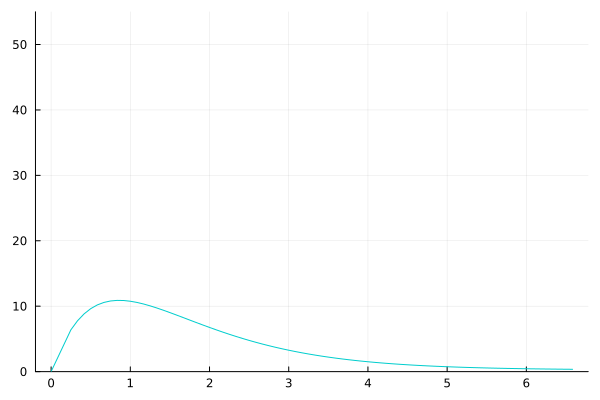

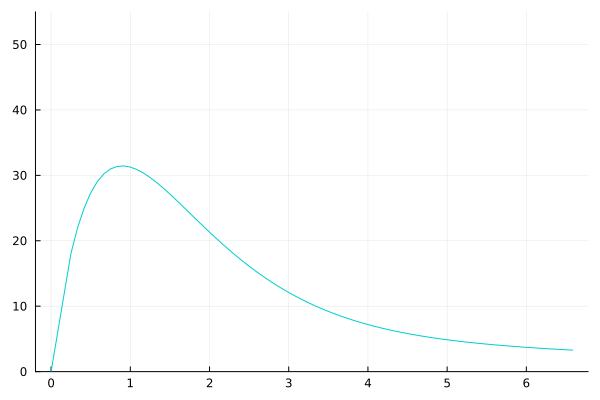

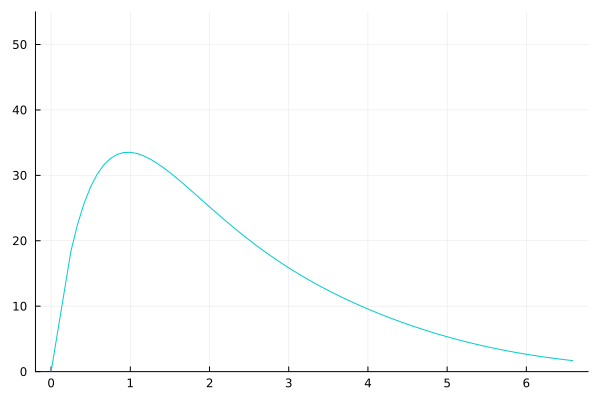

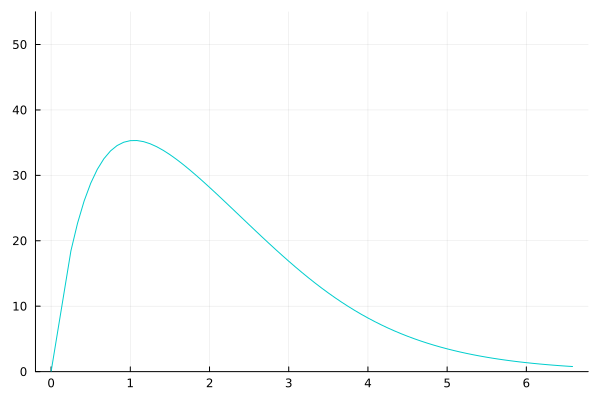

...

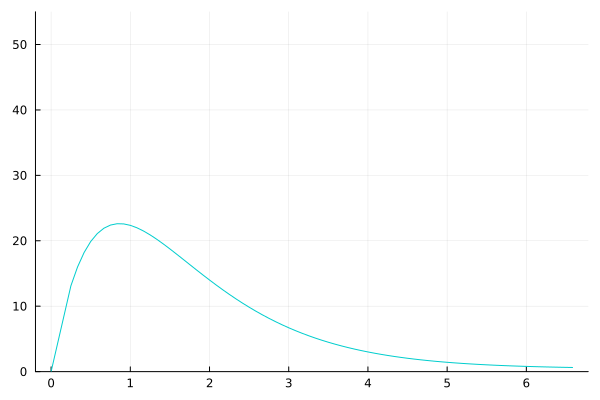

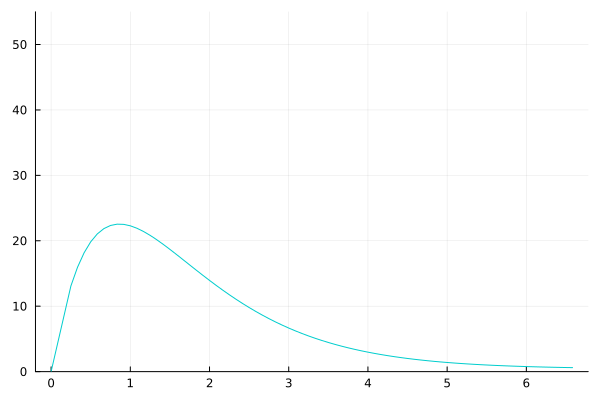

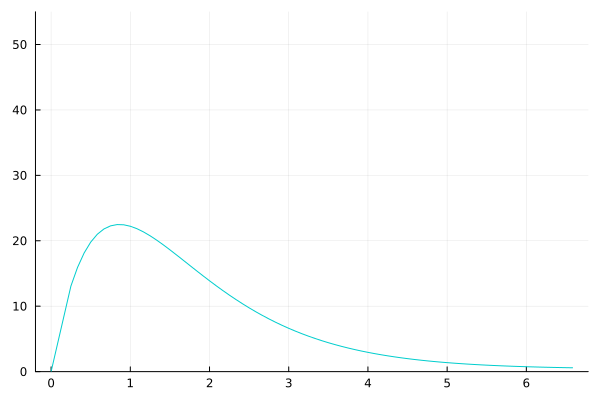

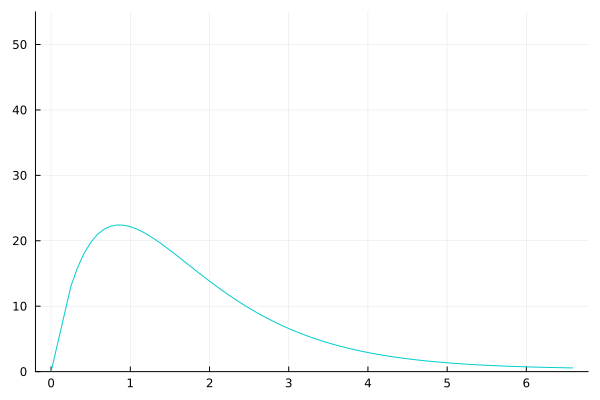

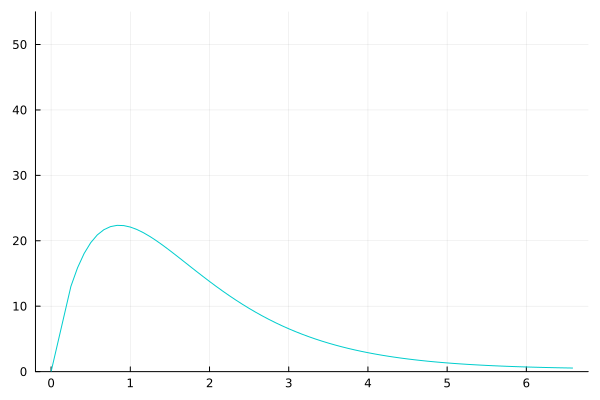

In [68]:
# video repress

ps = plot(tsC2./60, sims[1][:,11,1], label = "", colour = "Cyan3", ylim = (0, 100)) # Black low numbers, red middle, and white high
display(ps)
# savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\CompetitiveFit\\Sim"*string(1)*".png")
for i in 2:5:length(sims)    
    display(plot(tsC2./60, sims[i][:,11,1], label = "", colour = "Cyan3", ylim = (0, 55)))
    # sleep(0.1)
    # savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\CompetitiveFit\\Sim"*string(i)*".png")

end

